<a href="https://colab.research.google.com/github/ghada-ali123/AI_exercise/blob/main/copy_of_week_07_generative_ai.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Chapter 3 - Computer Vision

**This week's exercise has 4 tasks, for a total of 10 points. Don't forget to submit your solutions to GitHub!**

In this chapter, we want you to become proficient at the following tasks:
- Building a modern PyTorch segmentation model
- Training a modern model on a real-world segmentation task and achieving passable results

**Note**: This is the last exercise concerning pure computer vision. Starting next week, we will begin with Natural Language Processing, i.e. text data. Therefore, don't worry too much if this exercise feels hard or if you can't complete all of it ;)

#### Chapter 3.5 - Segmentation

In previous tasks, we solved classification problems - we provide some input(s), typically an image, and get out a few numbers, which are the predicted pseudo-probabilities that our input belongs to some class, such as "tumor" or "no tumor". For this exercise, we will explore a new task that is extremely common in medical AI research and in clinical practice. This task is called segmentation. In segmentation, the goal is to go from an input image to one or several segmentations (also called *segmentation maps*) of that image. For the example of LiTS, this means that our input remains the same - a 256x256 image with 1 channel. However, our model outputs and targets are now different - they also have the shape 256x256 pixels, times the number of output classes, in our case 3 (background, liver, liver+tumor). Each 256x256 output is basically a map of which pixels in the original image belong to a certain class with what (pseudo-)probability. The training objective, in its simplest form, is also the same; Cross-Entropy Loss, but per pixel, instead of per-image.

To solve today's tasks, we will need to build ourselves a few new things that look almost the same as things we have already built.

**Task 1 (2 points)**: We will need a new Dataset class. It is the same as usual, except this time, when we return image and target in the getitem method, our target is now also a multi-dimensional tensor of size.

We will return two kinds of targets - class-index targets and one-hot encoded targets. Class-index targets you already know. Every pixel is assigned a class, which can be 0 for background, 1 for liver, and 2 for lesions. The corresponding tensor has the size $H * W$. One-hot encoded targets instead have size $C * H * W$ - each channel is one class (the 0th channel is background, etc.), and the values for each pixel in a channel are 1 if that pixel belongs to that class and 0 if not. We will need both later on - class-index targets because that is the input for the normal CrossEntropyLoss, and one-hot targets because we will use them in this format for our DiceLoss.

Since the "background" class has no segmentations, you will have to improvise them from the existing segmentations for this task.

Your dataset class should return both targets at the end of the \_\_getitem\_\_ method like this: `return image, c_targets, oh_targets`.

In [1]:
!gdown 1TItTaso19GFTPdDnynVnqJvHsCm_RGlI
!rm -rf ./sample_data/
!unzip -qq Clean_LiTS.zip
!rm ./Clean_LiTS.zip

Downloading...
From (original): https://drive.google.com/uc?id=1TItTaso19GFTPdDnynVnqJvHsCm_RGlI
From (redirected): https://drive.google.com/uc?id=1TItTaso19GFTPdDnynVnqJvHsCm_RGlI&confirm=t&uuid=378554d9-4eed-483b-8600-a3543f84e3aa
To: /content/Clean_LiTS.zip
100% 2.56G/2.56G [00:20<00:00, 125MB/s]


In [2]:
import os
import re
import torch
import numpy as np
import PIL.Image
import torchvision.transforms.functional as ttf
import torch.nn.functional as F

class LiTS_Segmentation_Dataset(torch.utils.data.Dataset):

    def __init__(self, root, mode="train", transform=None):
        """
        root/mode contains CT images + liver masks + lesion masks
        """
        self.dir = os.path.join(root, mode)
        self.transform = transform

        self.ct_files = {}      # (vol, slice) -> file path
        self.liver_files = {}   # (vol, slice) -> file path
        self.lesion_files = {}  # (vol, slice) -> file path

        # regex patterns
        ct_pattern = re.compile(r"volume-(\d+)_(\d+)\.png")
        liver_pattern = re.compile(r"segmentation-(\d+)_livermask_(\d+)\.png")
        lesion_pattern = re.compile(r"segmentation-(\d+)_lesionmask_(\d+)\.png")

        # scan directory
        for f in os.listdir(self.dir):

            # CT images
            m = ct_pattern.match(f)
            if m:
                vol, slc = map(int, m.groups())
                self.ct_files[(vol, slc)] = f
                continue

            # liver mask
            m = liver_pattern.match(f)
            if m:
                vol, slc = map(int, m.groups())
                self.liver_files[(vol, slc)] = f
                continue

            # lesion mask
            m = lesion_pattern.match(f)
            if m:
                vol, slc = map(int, m.groups())
                self.lesion_files[(vol, slc)] = f
                continue

        # only keep slices where CT exists
        self.keys = sorted(list(self.ct_files.keys()))

    def __len__(self):
        return len(self.keys)

    def __getitem__(self, idx):
        vol, slc = self.keys[idx]

        # load CT
        ct_path = os.path.join(self.dir, self.ct_files[(vol, slc)])
        image = PIL.Image.open(ct_path).convert("L")
        image = ttf.pil_to_tensor(image).float()
        image = (image - image.min()) / (image.max() + 1e-8)

        H, W = image.shape[1], image.shape[2]

        # load liver mask (if exists)
        liver = np.zeros((H, W), dtype=np.uint8)
        if (vol, slc) in self.liver_files:
            liver_path = os.path.join(self.dir, self.liver_files[(vol, slc)])
            liver = np.array(PIL.Image.open(liver_path).convert("L"))
            liver = (liver > 0).astype(np.uint8)

        # load lesion mask (if exists)
        lesion = np.zeros((H, W), dtype=np.uint8)
        if (vol, slc) in self.lesion_files:
            lesion_path = os.path.join(self.dir, self.lesion_files[(vol, slc)])
            lesion = np.array(PIL.Image.open(lesion_path).convert("L"))
            lesion = (lesion > 0).astype(np.uint8)

        # build class targets
        c_targets = liver.copy()
        c_targets[lesion == 1] = 2
        c_targets = torch.tensor(c_targets, dtype=torch.long)

        # one-hot
        oh_targets = F.one_hot(c_targets, num_classes=3).permute(2,0,1).float()

        return image, c_targets, oh_targets


In [4]:
from torch.utils.data import DataLoader

# -------------------------
# 1. Dataset paths
# -------------------------
data_root = "/content/Clean_LiTS"  # folder that contains train, val, test

batch_size = 4                       # adjust based on GPU memory

# -------------------------
# 2. Create datasets
# -------------------------
train_dataset = LiTS_Segmentation_Dataset(root=data_root, mode="train")
val_dataset   = LiTS_Segmentation_Dataset(root=data_root, mode="val")
test_dataset  = LiTS_Segmentation_Dataset(root=data_root, mode="test")

print(f"Train samples: {len(train_dataset)}")
print(f"Validation samples: {len(val_dataset)}")
print(f"Test samples: {len(test_dataset)}")

# -------------------------
# 3. Create dataloaders
# -------------------------
train_dataloader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,       # shuffle training data
    num_workers=4,
)

val_dataloader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=False,      # no shuffle for validation
    num_workers=4,
)

test_dataloader = DataLoader(
    test_dataset,
    batch_size=batch_size,
    shuffle=False,      # no shuffle for test
    num_workers=4,
)

# -------------------------
# 4. Quick sanity check
# -------------------------
data, c_targets, oh_targets = next(iter(train_dataloader))
print("Train batch shapes:")
print(f"data: {data.shape}, c_targets: {c_targets.shape}, oh_targets: {oh_targets.shape}")


Train samples: 35484
Validation samples: 3039
Test samples: 3038


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Train batch shapes:
data: torch.Size([4, 1, 256, 256]), c_targets: torch.Size([4, 256, 256]), oh_targets: torch.Size([4, 3, 256, 256])


**Task 2 (2 points)**: Plot a few images that contain livers and tumors, as well as their corresponding segmentation maps. Do they look correct? Is there anything special to note?

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import torch

%matplotlib inline

# --------------------------------------------------------
# Convert class mask (0=BG, 1=Liver, 2=Lesion) → RGB overlay
# --------------------------------------------------------
def colorize_mask(mask):
    """
    mask: HxW tensor
    returns: HxWx3 RGB numpy array
    """
    mask = mask.cpu().numpy()
    H, W = mask.shape
    overlay = np.zeros((H, W, 3), dtype=np.uint8)
    overlay[mask == 1] = [0, 255, 0]   # Liver = green
    overlay[mask == 2] = [255, 0, 0]   # Lesion = red
    return overlay


# --------------------------------------------------------
# Fully working visualization function
# --------------------------------------------------------
def visualize_dataset(dataset, num_images=5):
    """
    dataset: LiTS_Segmentation_Dataset object
    num_images: number of slices to show
    """
    shown = 0
    for i in range(len(dataset)):
        image, c_targets, _ = dataset[i]

        # Only show slices with liver or lesions
        if torch.sum(c_targets > 0) > 0:
            # Convert image to numpy
            img_np = image.squeeze().cpu().numpy()

            # Normalize image for display (0-1)
            img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min() + 1e-8)

            # Convert mask to color overlay
            overlay = colorize_mask(c_targets)

            # Plot
            plt.figure(figsize=(10,4))
            plt.subplot(1,2,1)
            plt.title("CT Image")
            plt.imshow(img_np, cmap="gray")
            plt.axis("off")

            plt.subplot(1,2,2)
            plt.title("Overlay (Liver=Green, Lesion=Red)")
            plt.imshow(img_np, cmap="gray")
            plt.imshow(overlay, alpha=0.4)
            plt.axis("off")

            plt.show()

            shown += 1
            if shown >= num_images:
                break


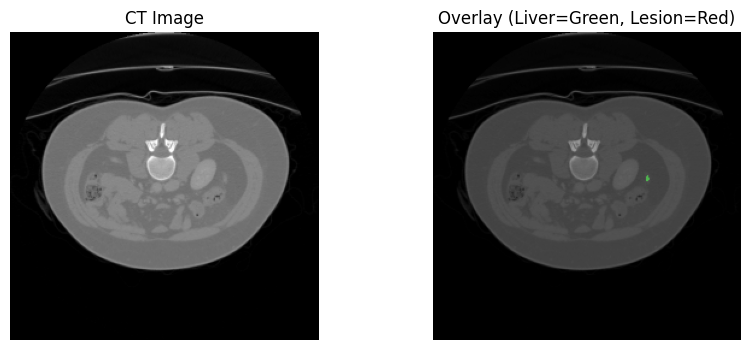

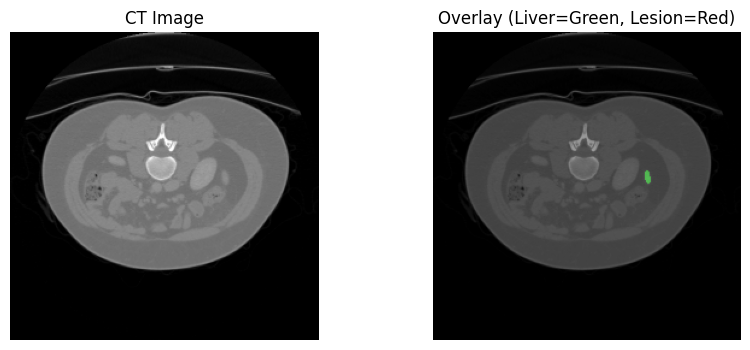

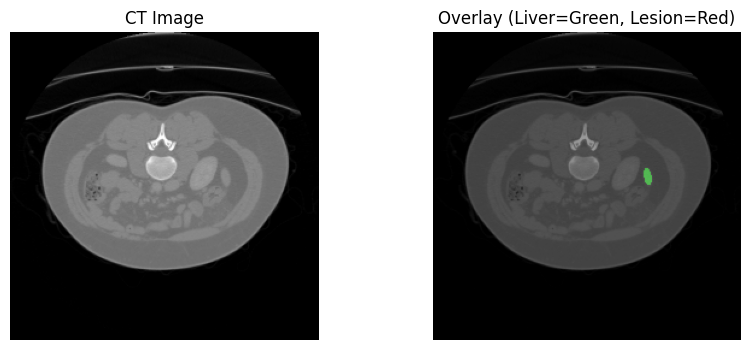

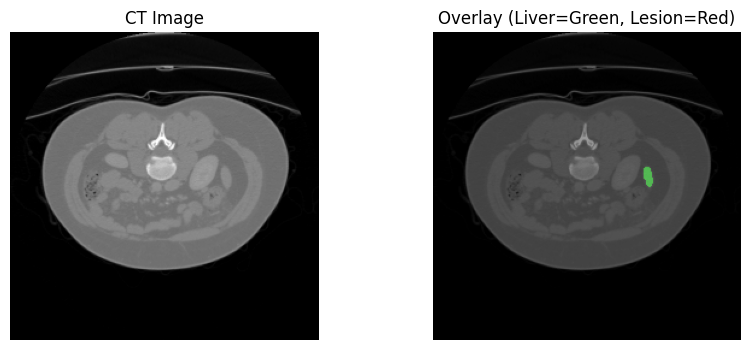

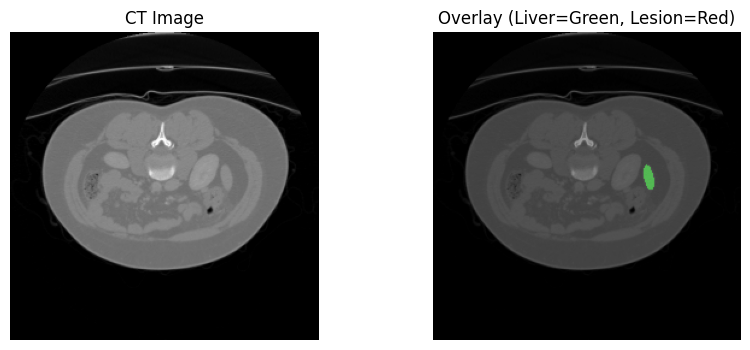

...

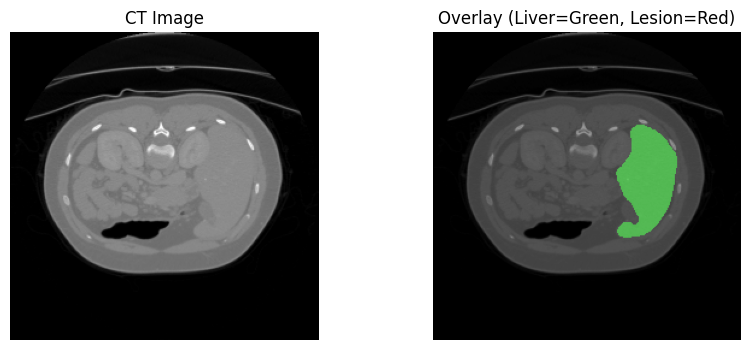

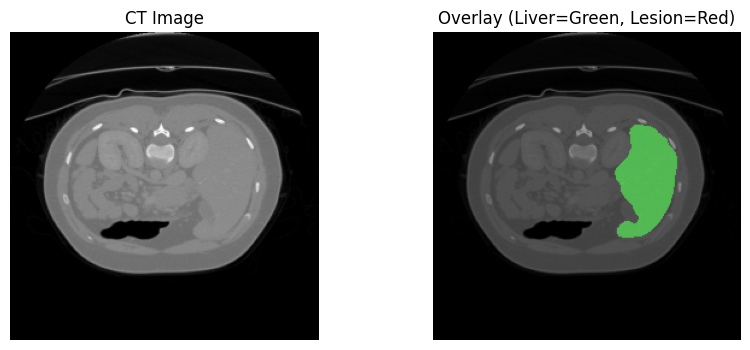

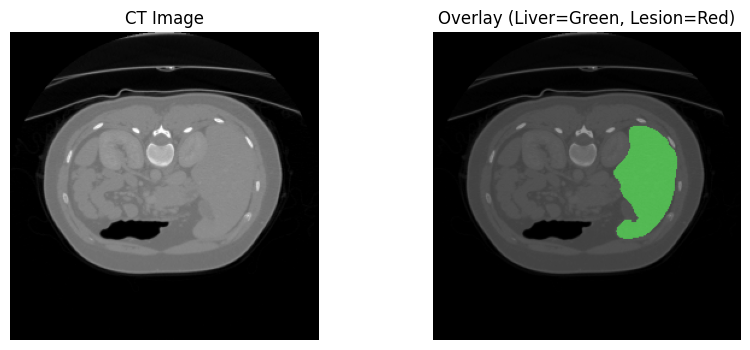

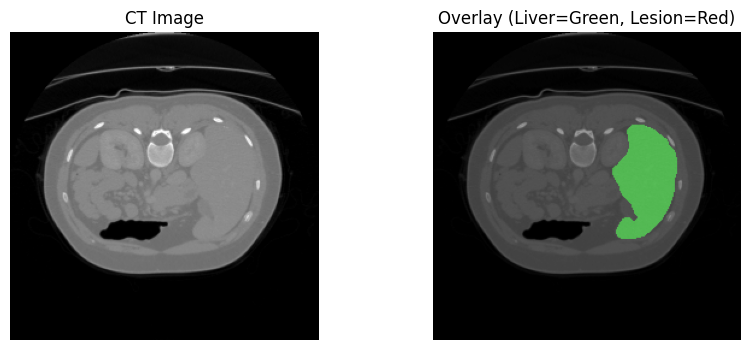

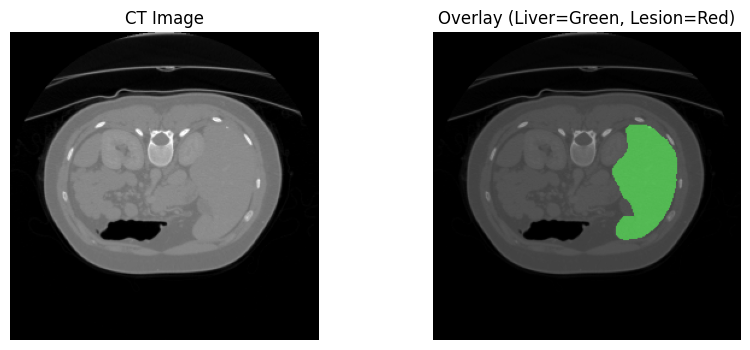

In [ ]:
# Suppose you already have your dataset:
# test_dataset = LiTS_Segmentation_Dataset(root="path_to_data", mode="test")

visualize_dataset(test_dataset, num_images=50)


In [ ]:
train_dataset = LiTS_Segmentation_Dataset("./Clean_LiTS", mode="train")
val_dataset   = LiTS_Segmentation_Dataset("./Clean_LiTS", mode="val")
test_dataset  = LiTS_Segmentation_Dataset("./Clean_LiTS", mode="test")


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from google.colab import files
%matplotlib inline

# --------------------------------------------------------
# Convert class mask (0=BG, 1=Liver, 2=Lesion) → RGB overlay
# --------------------------------------------------------
def colorize_mask(mask):
    mask = mask.cpu().numpy()
    H, W = mask.shape
    overlay = np.zeros((H, W, 3), dtype=np.uint8)
    overlay[mask == 1] = [0, 255, 0]   # Liver = green
    overlay[mask == 2] = [255, 0, 0]   # Lesion = red
    return overlay

# --------------------------------------------------------
# Fully working visualization with image name
# --------------------------------------------------------
def visualize_dataset_with_names(dataset, num_images=5):
    """
    dataset: LiTS_Segmentation_Dataset object
    num_images: number of slices to show
    """
    shown = 0
    for i in range(len(dataset)):
        image, c_targets, _ = dataset[i]

        # Only show slices with liver or lesions
        if torch.sum(c_targets > 0) > 0:
            # Convert image to numpy and normalize
            img_np = image.squeeze().cpu().numpy()
            img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min() + 1e-8)

            # Convert mask to color overlay
            overlay = colorize_mask(c_targets)

            # Retrieve the filename
            if hasattr(dataset, "keys") and hasattr(dataset, "ct_files"):
                vol, slc = dataset.keys[i]
                filename = dataset.ct_files.get((vol, slc), f"vol{vol}_slice{slc}")
            else:
                filename = f"Sample {i}"

            # Plot
            plt.figure(figsize=(10,4))
            plt.subplot(1,2,1)
            plt.title(f"CT Image\n{filename}")
            plt.imshow(img_np, cmap="gray")
            plt.axis("off")

            plt.subplot(1,2,2)
            plt.title(f"Overlay (Liver=Green, Lesion=Red)\n{filename}")
            plt.imshow(img_np, cmap="gray")
            plt.imshow(overlay, alpha=0.4)
            plt.axis("off")

            plt.show()

            shown += 1
            if shown >= num_images:
                break


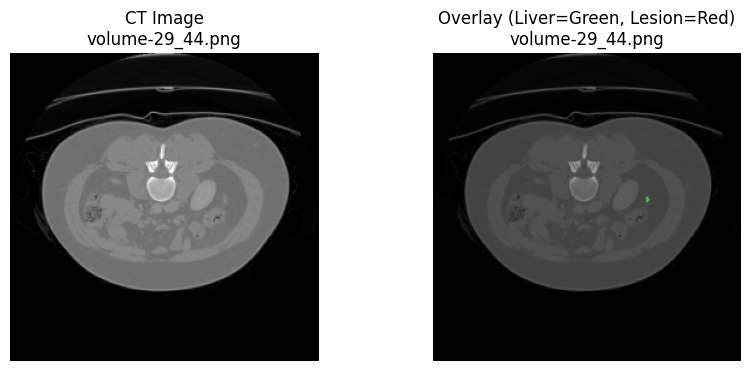

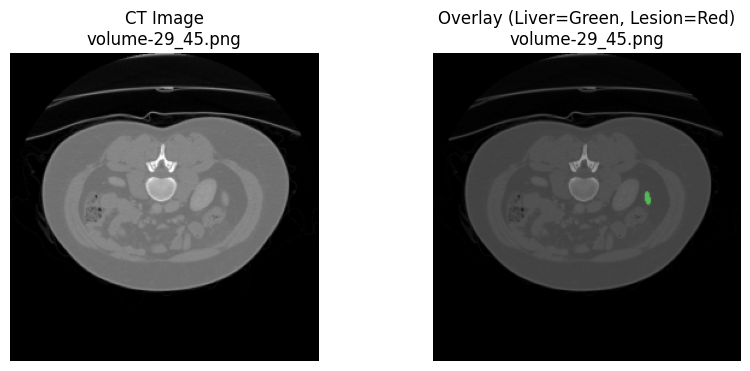

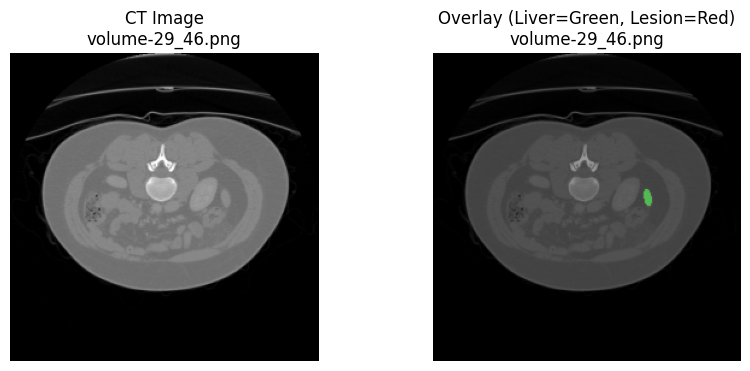

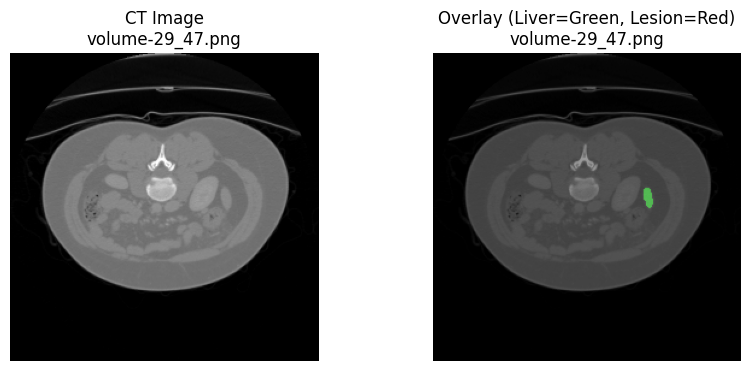

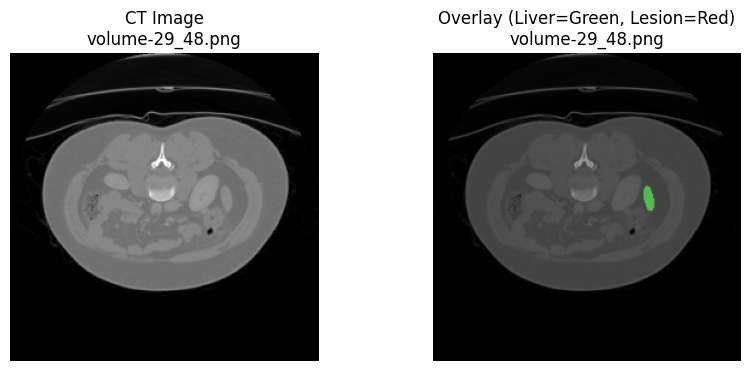

...

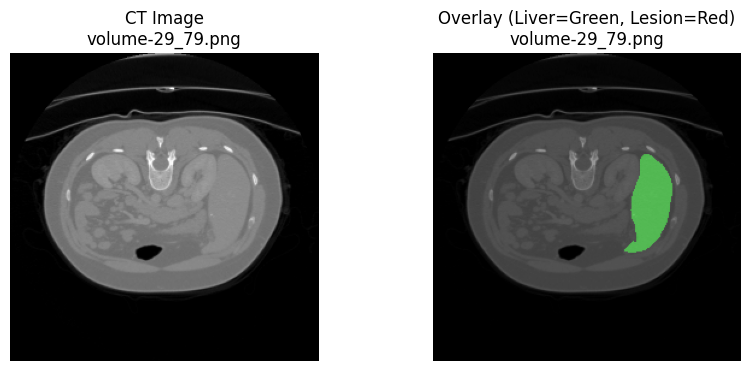

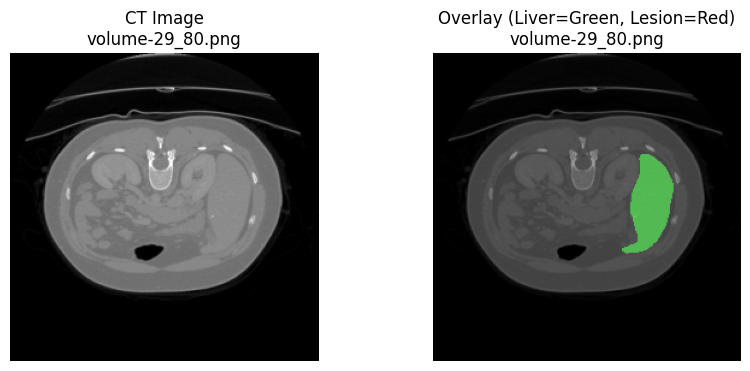

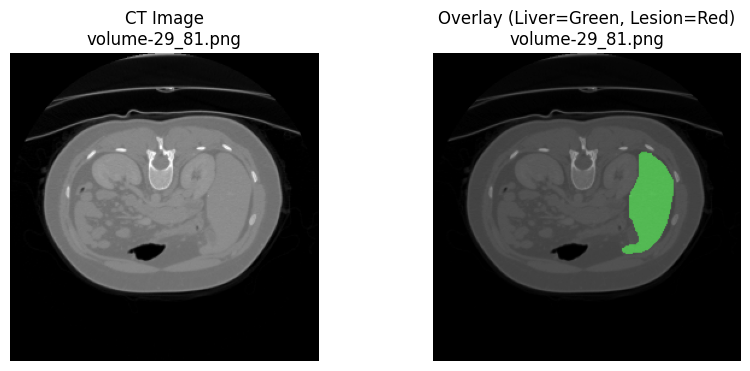

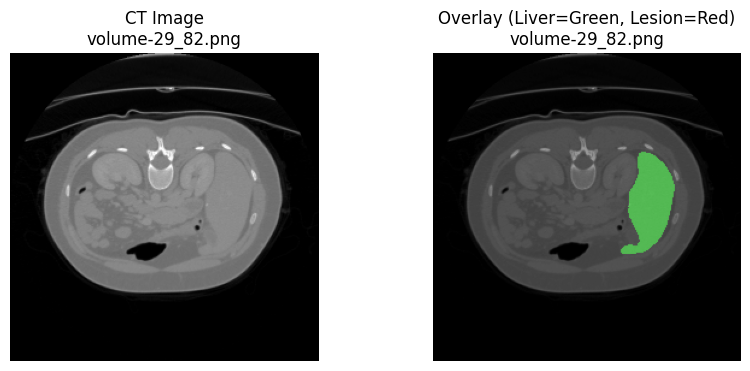

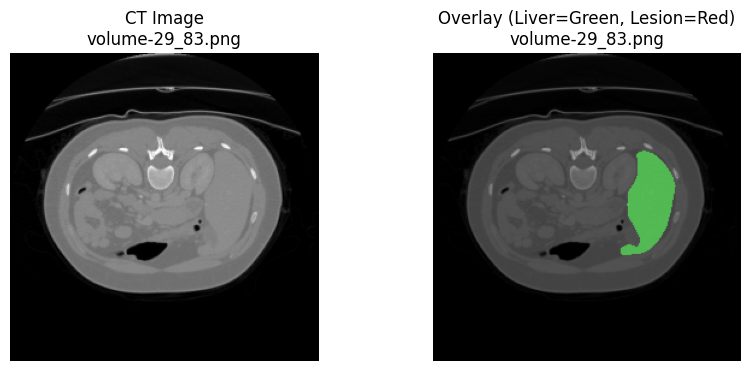

In [ ]:
# Suppose your dataset is:
# test_dataset = LiTS_Segmentation_Dataset(root="path_to_data", mode="test")

visualize_dataset_with_names(test_dataset, num_images=40)


In [ ]:
os.listdir("./Clean_LiTS/val")[:50]



['segmentation-4_livermask_24.png',
 'segmentation-2_livermask_511.png',
 'volume-4_477.png',
 'segmentation-4_livermask_649.png',
 'segmentation-2_lesionmask_172.png',
 'segmentation-6_livermask_283.png',
 'segmentation-4_livermask_371.png',
 'volume-5_159.png',
 'segmentation-6_livermask_503.png',
 'volume-4_777.png',
 'segmentation-3_livermask_31.png',
 'segmentation-3_livermask_20.png',
 'segmentation-3_livermask_180.png',
 'segmentation-4_livermask_387.png',
 'volume-3_495.png',
 'segmentation-2_lesionmask_221.png',
 'segmentation-4_lesionmask_610.png',
 'volume-6_365.png',
 'segmentation-2_lesionmask_397.png',
 'segmentation-3_lesionmask_61.png',
 'segmentation-3_lesionmask_21.png',
 'segmentation-5_livermask_111.png',
 'volume-4_275.png',
 'volume-5_236.png',
 'segmentation-4_lesionmask_492.png',
 'segmentation-4_livermask_582.png',
 'volume-4_478.png',
 'segmentation-4_livermask_328.png',
 'segmentation-5_lesionmask_28.png',
 'segmentation-6_lesionmask_347.png',
 'segmentation-

In [ ]:
import numpy as np
from PIL import Image

path = "./Clean_LiTS/val/segmentation-4_livermask_24.png"
img = np.array(Image.open(path).convert("L"))

print("Unique mask values:", np.unique(img))


Unique mask values: [0]


**Task 3 (2 points)**: Next, we need a different loss function. At the bottom, we provide a training/testing loop that already contains cross-entropy loss and a functional segmentation model, plus evaluation. We have learned in the lecture that DICE score, and by extension a DICE-based loss, can be useful for imbalanced classes. We have also discovered that LiTS 2017 contains a class imbalance - slices with tumors are much more rare than slices with livers. Hence, we will make our own DICE loss.

The formula for the DICE loss is computed as follows: $1 - \frac{2 * (|X \land Y|)+\epsilon}{|X|+|Y|+\epsilon}$, where $X$ is the prediction and $Y$ the target.

The DICE Loss class you create should fulfill the following criteria:
- It subclasses torch.nn.module.
- It is a class that implements an \_\_init\_\_ function.
- The loss also implements a \_\_forward\_\_ function that accepts as inputs a prediction tensor and a target tensor, both of shape B x 3 x 256 x 256 - 3 channels because we will segment background, liver, and liver+tumor again. The output is the computed loss.
- You may add class weighting to offset the class imbalance.

Your total loss should be `total_loss = ce_loss + dice_loss`, and your backward pass should be `total_loss.backward()`.
Run the training for a few epochs, once with and once without DICE loss included as part of the overall loss. In your experiment, which version worked better?

In [8]:
device = ("cuda" if torch.cuda.is_available() else "cpu")

model = UNet() # Your model class goes here
model = model.to(device)

ce_loss = nn.CrossEntropyLoss(
    weight = torch.tensor([1.0, 5.0, 20.0]).to(device = device),
    reduction = "mean",
    #ignore_index = 0
    )

optimizer = torch.optim.Adam(model.parameters(), lr = 1e-4)

In [ ]:
from tqdm.auto import tqdm
import torch.nn.functional as nnf
# training without Dice_loss
num_epochs = 5

for epoch in range(num_epochs):

    model.train()

    for step, (data, c_targets, oh_targets) in enumerate(train_dataloader):

        optimizer.zero_grad()

        data = data.to(device)
        c_targets = c_targets.to(device)

        predictions = model(data)


        #  TRAINING LOSS = CE ONLY
        # -----------------------------
        total_loss = ce_loss(predictions, c_targets)

        if step % 10 == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], Step [{step+1}/{len(train_dataloader)}], "
                  f"Loss: {total_loss.item():.4f}")

        total_loss.backward()
        optimizer.step()

    # ---------------------------------------------------
    # VALIDATION (Dice metrics only for evaluation)
    # ---------------------------------------------------

    model.eval()
    with torch.no_grad():

        val_losses = []
        batch_sizes = []

        background_dices, background_counts = [], []
        liver_dices, liver_counts = [], []
        lesion_dices, lesion_counts = [], []

        for val_step, (data, c_targets, oh_targets) in enumerate(tqdm(val_dataloader)):

            data = data.to(device)
            c_targets = c_targets.to(device)
            oh_targets = oh_targets.to(device)

            predictions = model(data)

            # VALIDATION LOSS = CE ONLY

            val_loss = ce_loss(predictions, c_targets)
            val_losses.append(val_loss.item())
            batch_sizes.append(data.size(0))


            # Dice Computation (evaluation only)

            p_arg = nnf.one_hot(torch.argmax(predictions, dim=1), num_classes=3).moveaxis(-1, 1)

            background_seg = oh_targets[:, 0]
            liver_seg      = oh_targets[:, 1]
            lesion_seg     = oh_targets[:, 2]

            # Background Dice
            background_dices.append(compute_dice_score(p_arg[:, 0], background_seg))
            background_counts.append(data.size(0))

            # Liver Dice
            if liver_seg.sum() != 0:
                liver_dices.append(compute_dice_score(p_arg[:, 1], liver_seg))
                liver_counts.append(data.size(0))

            # Lesion Dice
            if lesion_seg.sum() != 0:
                lesion_dices.append(compute_dice_score(p_arg[:, 2], lesion_seg))
                lesion_counts.append(data.size(0))

        # Weighted averages
        avg_loss = sum(l*s for l, s in zip(val_losses, batch_sizes)) / sum(batch_sizes)
        avg_background_dice = sum(d*s for d, s in zip(background_dices, background_counts)) / sum(background_counts)
        avg_liver_dice      = sum(d*s for d, s in zip(liver_dices, liver_counts)) / sum(liver_counts)
        avg_lesion_dice     = sum(d*s for d, s in zip(lesion_dices, lesion_counts)) / sum(lesion_counts)

        print(f"Epoch {epoch+1} — "
              f"Val Loss: {avg_loss:.4f}, "
              f"Liver Dice: {avg_liver_dice:.4f}, "
              f"Lesion Dice: {avg_lesion_dice:.4f}")


Epoch [1/5], Step [1/8871], Loss: 0.6419


In [7]:
import torch, torch.nn as nn, torch.nn.functional as nnf

def compute_dice_score(prediction: torch.Tensor, target: torch.Tensor):

    """
    Computes the dice score for one class.
    """

    prediction = prediction.to(dtype = torch.bool)
    target = target.to(dtype = torch.bool)

    intersection = torch.sum(prediction * target)   # TP
    p_cardinality = torch.sum(prediction)           # TP+FP
    t_cardinality = torch.sum(target)               # TP+FN
    cardinality = p_cardinality + t_cardinality
    eps = 1e-8

    if cardinality != 0:
        dice = (2 * intersection + eps) / (cardinality + eps) # 2*TP / (2*TP+FP+FN + eps)
    else:
        dice = None

    return dice

class BinaryDiceLoss(nn.Module):

    """
    Binary Dice Loss. Targets must be one-hot encoded.
    Needed to make a full DICE loss, this computes dice loss for one channel.
    """

    def __init__(self, eps=1e-6, weight=1.0):
        super().__init__()
        self.eps = eps
        self.weight = weight



    def forward(self, prediction: torch.Tensor, target: torch.Tensor):

         # Flatten predictions and targets
        prediction = prediction.contiguous().view(prediction.size(0), -1)
        target = target.contiguous().view(target.size(0), -1)

        intersection = (prediction * target).sum(dim=1)
        dice_score = (2 * intersection + self.eps) / (
            prediction.sum(dim=1) + target.sum(dim=1) + self.eps
        )

        dice_loss = 1 - dice_score           # Dice loss
        return self.weight * dice_loss.mean()

class DiceLoss(nn.Module):

    """
    Dice Loss. Targets must be one-hot encoded.
    """

    def __init__(self, num_classes: int, class_weights=None):
        super().__init__()
        self.num_classes = num_classes

        if class_weights is None:
            class_weights = [1.0] * num_classes

        self.class_weights = class_weights
        self.binary_losses = nn.ModuleList(
            [BinaryDiceLoss(weight=w) for w in class_weights]
        )



    def forward(self, predictions: torch.Tensor, targets: torch.Tensor):

         dice_total = 0
         for c in range(self.num_classes):
            dice_total += self.binary_losses[c](
                predictions[:, c], targets[:, c]
            )

         return dice_total / self.num_classes


**Task 4 (4 points)**: Finally, we want to make our own model that can handle segmentations. For this course, we will build ourselves a U-Net. The original paper can be found here: https://arxiv.org/pdf/1505.04597.

The input dimensions for the network will be the usual B x 1 x 256 x 256. The output dimensions should be B x 3 x 256 x 256. We have three output channels because we will still predict classes 0 (background), 1 (liver) and 2 (liver tumor) - this time, however, we predict the classes on a per-pixel basis.

Since our input images have vastly smaller dimensions compared to those used in the original UNet-Paper, we will opt for a different scale of UNet. The general design remains the same as in the paper, except:

- We will only downsample 3 times by a factor of 2, using MaxPool (for a minimum resolution 32x32).
- Our 3x3 Convolutions will have Padding. Consequently, there will be no cropping during skip connections
- We will only have 3 skip connections.
- We will go for fewer maximum channels (as we have only 3 downsampling steps, we will have 64, 128, 256, and 512 channels).
- Our final output will be 3 channels wide, not 2 (we predict background, liver, and liver tumors).

Note that training a segmentation models takes a little while - we do not award points for results here, because it would mean that you would have to wait a long time to see whether your changes helped performance. All we want to see is that your model learns anything useful at all. As a rough guideline, you will probably start seeing ok liver segmentations after 1 epoch, and good liver and ok lesion segmentations after 2 or 3 epochs.

If everything works correctly, you can copy the previous training loop and should get some good results. Don't forget to look at some of your predictions! Are they reasonable? Empty? Weird? Can you discover some kind of systemic issues with your predictions?

In [5]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# Basic Conv Block: Conv → ReLU → Conv → ReLU

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),

            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.block(x)



class UNet(nn.Module):
    def __init__(self, in_channels=1, num_classes=3):
        super().__init__()

        # -------- Encoder --------
        self.down1 = DoubleConv(in_channels, 64)     # 256 → 256
        self.pool1 = nn.MaxPool2d(2)                 # 256 → 128

        self.down2 = DoubleConv(64, 128)             # 128 → 128
        self.pool2 = nn.MaxPool2d(2)                 # 128 → 64

        self.down3 = DoubleConv(128, 256)            # 64 → 64
        self.pool3 = nn.MaxPool2d(2)                 # 64 → 32

        # -------- Bottleneck --------
        self.bottleneck = DoubleConv(256, 512)       # 32 → 32

        # -------- Decoder --------
        self.up3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)  # 32 → 64
        self.conv3 = DoubleConv(512, 256)           # concat: 256 skip + 256 up = 512

        self.up2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)  # 64 → 128
        self.conv2 = DoubleConv(256, 128)           # concat: 128 skip + 128 up

        self.up1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)   # 128 → 256
        self.conv1 = DoubleConv(128, 64)            # concat: 64 skip + 64 up

        # -------- Final classifier --------
        self.output_layer = nn.Conv2d(64, num_classes, kernel_size=1)

    def forward(self, x):

        # ---- Encoder ----
        x1 = self.down1(x)       # 64
        x2 = self.down2(self.pool1(x1))    # 128
        x3 = self.down3(self.pool2(x2))    # 256

        # ---- Bottleneck ----
        x4 = self.bottleneck(self.pool3(x3))

        # ---- Decoder ----
        u3 = self.up3(x4)
        u3 = torch.cat([u3, x3], dim=1)
        u3 = self.conv3(u3)

        u2 = self.up2(u3)
        u2 = torch.cat([u2, x2], dim=1)
        u2 = self.conv2(u2)

        u1 = self.up1(u2)
        u1 = torch.cat([u1, x1], dim=1)
        u1 = self.conv1(u1)

        # ---- Output ----
        logits = self.output_layer(u1)   # B × 3 × 256 × 256
        return logits


In [8]:
device = ("cuda" if torch.cuda.is_available() else "cpu")

model = UNet() # Your model class goes here
model = model.to(device)

dice_loss = DiceLoss(num_classes = 3) # Your dice loss class goes here
ce_loss = nn.CrossEntropyLoss(
    weight = torch.tensor([1.0, 5.0, 20.0]).to(device = device),
    reduction = "mean",
    #ignore_index = 0
    )

optimizer = torch.optim.Adam(model.parameters(), lr = 1e-4)

In [9]:
# If your model and loss work, this should at least execute successfully.
# If you only wish to test your model, just comment out the dice_loss component everywhere.

from tqdm.auto import tqdm

num_epochs = 5
avg_liver_dice = 0
avg_lesion_dice = 0
dice_weight = 1
ce_weight = 1

for epoch in range(num_epochs):

    for step, (data, c_targets, oh_targets) in enumerate(train_dataloader):

        optimizer.zero_grad()
        data, c_targets, oh_targets = data.to(device), c_targets.to(device), oh_targets.to(device)
        predictions = model(data)

        loss_1 = dice_loss(predictions, oh_targets)
        loss_2 = ce_loss(predictions, c_targets)
        total_loss = loss_1 * dice_weight + loss_2 * ce_weight # We could weight contributions from the different loss components here, although 1-to-1 should do just fine

        if step % 10 == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}]\t Step [{step+1}/{len(train_dataloader.dataset)//batch_size}]\t Loss: {total_loss.item():.4f}")

        total_loss.backward()
        optimizer.step()

        # Validate once after every epoch
        model.eval()

        # Don't track gradients for validation
        with torch.no_grad():

            losses = []
            background_dices = []
            background_counts = []
            liver_dices = []
            liver_counts = []
            lesion_dices = []
            lesion_counts = []
            batch_sizes = []

            for val_step, (data, c_targets, oh_targets) in enumerate(tqdm(val_dataloader)):

                data, c_targets, oh_targets = data.to(device), c_targets.to(device), oh_targets.to(device)
                predictions = model(data)
                # Choose the likeliest prediction via argmax, then convert to one-hot, and put the new axis in front again
                p_arg = nnf.one_hot(torch.argmax(predictions, dim = 1), num_classes = 3).moveaxis(-1, 1)

                # loss
                loss_1 = dice_loss(predictions, oh_targets)
                loss_2 = ce_loss(predictions, c_targets)
                total_loss = loss_1 * dice_weight + loss_2 * ce_weight # We could weight contributions from the different loss components here, although 1-to-1 should do just fine

                losses.append(total_loss.item())
                batch_sizes.append(data.size()[0])

                background_seg = oh_targets[:, 0, :, :]
                liver_seg = oh_targets[:, 1, :, :]
                lesion_seg = oh_targets[:, 2, :, :]

                background_dice = compute_dice_score(p_arg[:,0,:,:], background_seg)
                background_counts.append(data.size()[0])
                background_dices.append(background_dice)

                if liver_seg.sum() != 0.0:
                    liver_dice = compute_dice_score(p_arg[:,1,:,:], liver_seg)
                    liver_counts.append(data.size()[0])
                    liver_dices.append(liver_dice)

                if lesion_seg.sum() != 0.0:
                    lesion_dice = compute_dice_score(p_arg[:,2,:,:], lesion_seg)
                    lesion_counts.append(data.size()[0])
                    lesion_dices.append(lesion_dice)

            avg_background_dice = sum([dice * size for dice, size in zip(background_dices, background_counts)])/sum(background_counts)
            avg_liver_dice = sum([dice * size for dice, size in zip(liver_dices, liver_counts)])/sum(liver_counts)
            avg_lesion_dice = sum([dice * size for dice, size in zip(lesion_dices, lesion_counts)])/sum(lesion_counts)

            avg_loss = sum([l * bs for l, bs in zip(losses, background_counts)]) / sum(background_counts)
            print(f"Epoch: {epoch+1},\t Validation Loss: {avg_loss:.4f},\t Liver Dice Score: {avg_liver_dice:.4f}, \t Lesion Dice Score: {avg_lesion_dice:.4f}")

            # After we are done validating, let's not forget to go back to storing gradients.
            model.train()

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch [1/5]	 Step [1/8871]	 Loss: 2.4983


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.0273,	 Liver Dice Score: 0.0000, 	 Lesion Dice Score: 0.0000


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.0473,	 Liver Dice Score: 0.0000, 	 Lesion Dice Score: 0.0000


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.0413,	 Liver Dice Score: 0.0000, 	 Lesion Dice Score: 0.0000


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.0626,	 Liver Dice Score: 0.0000, 	 Lesion Dice Score: 0.0000


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.0859,	 Liver Dice Score: 0.0000, 	 Lesion Dice Score: 0.0000


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.1569,	 Liver Dice Score: 0.0068, 	 Lesion Dice Score: 0.0000


  0%|          | 0/760 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>    
self._shutdown_workers()Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__

      File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
self._shutdown_workers()    
if w.is_alive():  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    
Exception ignored in:  <function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020> if w.is_alive():
Exception ignored in:  Traceback (most recent call last):

   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/da

Epoch: 1,	 Validation Loss: 2.1225,	 Liver Dice Score: 0.1540, 	 Lesion Dice Score: 0.0000


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.1043,	 Liver Dice Score: 0.1492, 	 Lesion Dice Score: 0.0000


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.1323,	 Liver Dice Score: 0.1698, 	 Lesion Dice Score: 0.0000


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.1587,	 Liver Dice Score: 0.1808, 	 Lesion Dice Score: 0.0000
Epoch [1/5]	 Step [11/8871]	 Loss: 2.3526


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.2058,	 Liver Dice Score: 0.1891, 	 Lesion Dice Score: 0.0000


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 1.0136,	 Liver Dice Score: 0.1713, 	 Lesion Dice Score: 0.0000


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.1917,	 Liver Dice Score: 0.1245, 	 Lesion Dice Score: 0.0001


  0%|          | 0/760 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>Traceback (most recent call last):

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
Traceback (most recent call last):
      File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
self._shutdown_workers()    
self._shutdown_workers()  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers

    if w.is_alive():  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers

     Exception ignored in:  if w.is_alive(): 
 <function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>   
 Traceback (most recent call last):
    File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", li

Epoch: 1,	 Validation Loss: 2.1853,	 Liver Dice Score: 0.1157, 	 Lesion Dice Score: 0.0003


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.2047,	 Liver Dice Score: 0.0913, 	 Lesion Dice Score: 0.0005


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.2257,	 Liver Dice Score: 0.0898, 	 Lesion Dice Score: 0.0006


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.2274,	 Liver Dice Score: 0.0826, 	 Lesion Dice Score: 0.0005


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.2458,	 Liver Dice Score: 0.0695, 	 Lesion Dice Score: 0.0004


  0%|          | 0/760 [00:00<?, ?it/s]

Exception ignored in: Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020><function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>
<function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>

Exception ignored in: Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
<function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
Traceback (most recent call last):
        
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
self._shutdown_workers()self._shutdown_workers()Traceback (most recent call last):

    
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
  File "/usr/local/lib/pyt

Epoch: 1,	 Validation Loss: 2.2682,	 Liver Dice Score: 0.0625, 	 Lesion Dice Score: 0.0029


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.2749,	 Liver Dice Score: 0.0430, 	 Lesion Dice Score: 0.0127
Epoch [1/5]	 Step [21/8871]	 Loss: 2.2877


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.2936,	 Liver Dice Score: 0.0410, 	 Lesion Dice Score: 0.0155


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.3056,	 Liver Dice Score: 0.0558, 	 Lesion Dice Score: 0.0161


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.3054,	 Liver Dice Score: 0.0521, 	 Lesion Dice Score: 0.0168


Exception ignored in: Traceback (most recent call last):
<function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>
Exception ignored in: Exception ignored in:   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
<function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020><function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>

  0%|          | 0/760 [00:00<?, ?it/s]

Exception ignored in:     

self._shutdown_workers()Traceback (most recent call last):
Traceback (most recent call last):

<function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    Traceback (most recent call last):
          File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
if w.is_alive():self._shutdown_workers()self._shutdown_workers()
    

Exception ignored in:  self._shutdown_workers()  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
<function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>  File "/usr/local/lib/python3.12/dist-pac

Epoch: 1,	 Validation Loss: 2.3250,	 Liver Dice Score: 0.0567, 	 Lesion Dice Score: 0.0158


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.3227,	 Liver Dice Score: 0.0455, 	 Lesion Dice Score: 0.0113


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.3379,	 Liver Dice Score: 0.0205, 	 Lesion Dice Score: 0.0060


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.3385,	 Liver Dice Score: 0.0090, 	 Lesion Dice Score: 0.0031


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.3681,	 Liver Dice Score: 0.0097, 	 Lesion Dice Score: 0.0025


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.3889,	 Liver Dice Score: 0.0056, 	 Lesion Dice Score: 0.0018


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.3621,	 Liver Dice Score: 0.0021, 	 Lesion Dice Score: 0.0019
Epoch [1/5]	 Step [31/8871]	 Loss: 2.2473


  0%|          | 0/760 [00:00<?, ?it/s]

Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>
Traceback (most recent call last):

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
Traceback (most recent call last):
<function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
        self._shutdown_workers()Exception ignored in: 

self._shutdown_workers()  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
<function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>Traceback (most recent call last):
    

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
if w.is_alive():  File "/usr/local/lib/py

Epoch: 1,	 Validation Loss: 2.3703,	 Liver Dice Score: 0.0017, 	 Lesion Dice Score: 0.0058


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.4186,	 Liver Dice Score: 0.0052, 	 Lesion Dice Score: 0.0118


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.3992,	 Liver Dice Score: 0.0052, 	 Lesion Dice Score: 0.0150


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.3844,	 Liver Dice Score: 0.0036, 	 Lesion Dice Score: 0.0174


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.4037,	 Liver Dice Score: 0.0024, 	 Lesion Dice Score: 0.0203


Exception ignored in: Exception ignored in: 

  0%|          | 0/760 [00:00<?, ?it/s]

<function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020><function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>
Exception ignored in: 
Traceback (most recent call last):
<function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>Exception ignored in: Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__

<function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>    
Traceback (most recent call last):
    Exception ignored in: self._shutdown_workers()Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
self._shutdown_workers()  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__

Exception ignored in: <function _MultiProcessingDataL

Epoch: 1,	 Validation Loss: 2.2611,	 Liver Dice Score: 0.0015, 	 Lesion Dice Score: 0.0245


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.4243,	 Liver Dice Score: 0.0037, 	 Lesion Dice Score: 0.0264


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.4220,	 Liver Dice Score: 0.0088, 	 Lesion Dice Score: 0.0271


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.4071,	 Liver Dice Score: 0.0104, 	 Lesion Dice Score: 0.0256


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.4187,	 Liver Dice Score: 0.0165, 	 Lesion Dice Score: 0.0281
Epoch [1/5]	 Step [41/8871]	 Loss: 2.1891


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.4161,	 Liver Dice Score: 0.0302, 	 Lesion Dice Score: 0.0287


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.3705,	 Liver Dice Score: 0.0432, 	 Lesion Dice Score: 0.0322


  0%|          | 0/760 [00:00<?, ?it/s]

Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>
<function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>Traceback (most recent call last):
Exception ignored in: 
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
Traceback (most recent call last):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020><function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__

    
    Traceback (most recent call last):
self._shutdown_workers()Traceback (most recent call last):
self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__

          File "/usr/local/lib

Epoch: 1,	 Validation Loss: 2.5424,	 Liver Dice Score: 0.0743, 	 Lesion Dice Score: 0.0333


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.4976,	 Liver Dice Score: 0.0888, 	 Lesion Dice Score: 0.0359


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.3819,	 Liver Dice Score: 0.0842, 	 Lesion Dice Score: 0.0385


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.3940,	 Liver Dice Score: 0.0808, 	 Lesion Dice Score: 0.0401


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.3902,	 Liver Dice Score: 0.0784, 	 Lesion Dice Score: 0.0417


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>Exception ignored in: 
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020><function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>

  0%|          | 0/760 [00:00<?, ?it/s]

Traceback (most recent call last):

Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
Exception ignored in: 
    <function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
Traceback (most recent call last):

    Traceback (most recent call last):
self._shutdown_workers()  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    
self._shutdown_workers()      File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers

self._shutdown_workers()  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
self._shutdown_workers()
          File 

Epoch: 1,	 Validation Loss: 2.4314,	 Liver Dice Score: 0.0799, 	 Lesion Dice Score: 0.0434


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.3780,	 Liver Dice Score: 0.0749, 	 Lesion Dice Score: 0.0435


  0%|          | 0/760 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^Exception ignored in: ^<function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>^^
^Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
^    ^^self._shutdown_workers()^

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
        if w.is_alive():
assert self._parent_pid == os.getpid(), 'can only test a child process' 
            ^ ^ ^ ^ ^ ^^^^^^^^^^^^^^^
  Fi

Epoch: 1,	 Validation Loss: 2.3466,	 Liver Dice Score: 0.0764, 	 Lesion Dice Score: 0.0460
Epoch [1/5]	 Step [51/8871]	 Loss: 2.2093


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.2137,	 Liver Dice Score: 0.0750, 	 Lesion Dice Score: 0.0475


  0%|          | 0/760 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    Exception ignored in: assert self._parent_pid == os.getpid(), 'can only test a child process'<function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>

Traceback (most recent call last):
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
        self._shutdown_workers() 
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
      if w.is_alive(): 
    ^ ^^^ ^  ^ ^^^^^^^^^^^^^^^^^^^

Epoch: 1,	 Validation Loss: 2.2651,	 Liver Dice Score: 0.0733, 	 Lesion Dice Score: 0.0479


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.3309,	 Liver Dice Score: 0.0674, 	 Lesion Dice Score: 0.0474


  0%|          | 0/760 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
Exception ignored in:  <function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020> 
Traceback (most recent call last):
    File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
      self._shutdown_workers() 
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
       if w.is_alive(): 
^ ^  ^^ ^  ^^^ ^^^^^^^^^^^^^^^^^

Epoch: 1,	 Validation Loss: 2.3257,	 Liver Dice Score: 0.0655, 	 Lesion Dice Score: 0.0477


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.3141,	 Liver Dice Score: 0.0658, 	 Lesion Dice Score: 0.0482


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.3179,	 Liver Dice Score: 0.0611, 	 Lesion Dice Score: 0.0478


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.2931,	 Liver Dice Score: 0.0664, 	 Lesion Dice Score: 0.0485


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.2878,	 Liver Dice Score: 0.0523, 	 Lesion Dice Score: 0.0476


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.2734,	 Liver Dice Score: 0.0492, 	 Lesion Dice Score: 0.0473


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.2514,	 Liver Dice Score: 0.0482, 	 Lesion Dice Score: 0.0476
Epoch [1/5]	 Step [61/8871]	 Loss: 2.1642


Exception ignored in: 

  0%|          | 0/760 [00:00<?, ?it/s]

<function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>
Exception ignored in: Exception ignored in: Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
<function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020><function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>Exception ignored in: 

    Traceback (most recent call last):
Traceback (most recent call last):
Exception ignored in: self._shutdown_workers()  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
<function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    <function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>    Traceback

Epoch: 1,	 Validation Loss: 2.2481,	 Liver Dice Score: 0.0453, 	 Lesion Dice Score: 0.0474


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.2439,	 Liver Dice Score: 0.0422, 	 Lesion Dice Score: 0.0474


  0%|          | 0/760 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^Exception ignored in: ^^<function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>^^
^Traceback (most recent call last):
^^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
^
      File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
self._shutdown_workers()
      File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
assert self._parent_pid == os.getpid(), 'can only test a child process'    
if w.is_alive():
               ^ ^ ^ ^^^^^^^^^^^^^^^
  File

Epoch: 1,	 Validation Loss: 2.2381,	 Liver Dice Score: 0.0428, 	 Lesion Dice Score: 0.0476


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.2279,	 Liver Dice Score: 0.0354, 	 Lesion Dice Score: 0.0473


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.2148,	 Liver Dice Score: 0.0379, 	 Lesion Dice Score: 0.0476


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.2053,	 Liver Dice Score: 0.0397, 	 Lesion Dice Score: 0.0478


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.1958,	 Liver Dice Score: 0.0347, 	 Lesion Dice Score: 0.0477


Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020><function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>

Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
Traceback (most recent call last):
    self._shutdown_workers()  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__

Exception ignored in:       File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
self._shutdown_workers()

  0%|          | 0/760 [00:00<?, ?it/s]

    
<function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>if w.is_alive():  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers

Exception ignored in:      
 if w.is_alive(): <function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>Traceback (most recent call last):

 
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
 Traceback (most recent call last):
        File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
 self._shutdown_workers()     ^self._shutdown_workers()
 
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
^Exception ignored in:  ^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
     ^     if w.is_alive():^<function _MultiProcessingDataLoaderIter.__del__ at 0x7869e91

Epoch: 1,	 Validation Loss: 2.1744,	 Liver Dice Score: 0.0440, 	 Lesion Dice Score: 0.0483


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.1571,	 Liver Dice Score: 0.0538, 	 Lesion Dice Score: 0.0488


  0%|          | 0/760 [00:00<?, ?it/s]

Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers

    if w.is_alive():
      Exception ignored in:  ^<function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>^
^Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    ^self._shutdown_workers()^
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
^    ^^if w.is_alive():
  ^^ 
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process' 
       ^  ^^ ^  ^ ^^ ^^^^^^^^^^^^
^  Fi

Epoch: 1,	 Validation Loss: 2.1529,	 Liver Dice Score: 0.0551, 	 Lesion Dice Score: 0.0490
Epoch [1/5]	 Step [71/8871]	 Loss: 2.0722


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.1383,	 Liver Dice Score: 0.0549, 	 Lesion Dice Score: 0.0490


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.1187,	 Liver Dice Score: 0.0658, 	 Lesion Dice Score: 0.0494


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.1076,	 Liver Dice Score: 0.0734, 	 Lesion Dice Score: 0.0494


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.1042,	 Liver Dice Score: 0.0717, 	 Lesion Dice Score: 0.0493


  0%|          | 0/760 [00:00<?, ?it/s]

Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020><function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>Exception ignored in: Traceback (most recent call last):


  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
<function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>Traceback (most recent call last):

Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
      File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
Exception ignored in:       File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()self._shutdown_workers()<funct

Epoch: 1,	 Validation Loss: 2.1017,	 Liver Dice Score: 0.0659, 	 Lesion Dice Score: 0.0491


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.0516,	 Liver Dice Score: 0.0667, 	 Lesion Dice Score: 0.0490


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.0950,	 Liver Dice Score: 0.0600, 	 Lesion Dice Score: 0.0490


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.0806,	 Liver Dice Score: 0.0659, 	 Lesion Dice Score: 0.0492


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.0829,	 Liver Dice Score: 0.0616, 	 Lesion Dice Score: 0.0490


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    Exception ignored in: self._shutdown_workers()
<function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>Exception ignored in:   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():

<function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020> Traceback (most recent call last):

   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
 Traceback (most recent call last):
      File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
       

  0%|          | 0/760 [00:00<?, ?it/s]

self._shutdown_workers() self._shutdown_workers()

^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
Exception ignored in:         ^if w.is_alive():if w.is_alive():^
<function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>
  
^ ^Traceback (most recent call last):
     File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
^     Exception ignored in: ^   self._shutdown_workers() ^ 
^ ^ <function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>Exception ignored in: ^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
^
^    ^^Traceback (most recent call last):

^^  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
if w.is_alive():  File "/usr/local/lib/python3.1

Epoch: 1,	 Validation Loss: 2.0773,	 Liver Dice Score: 0.0642, 	 Lesion Dice Score: 0.0491
Epoch [1/5]	 Step [81/8871]	 Loss: 2.0985


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.0651,	 Liver Dice Score: 0.0552, 	 Lesion Dice Score: 0.0491


  0%|          | 0/760 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
Exception ignored in:     <function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>self._shutdown_workers()
Traceback (most recent call last):

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
      File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    self._shutdown_workers()if w.is_alive():

   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
       if w.is_alive():
      ^^ ^  ^ ^^^^^^^^^^^^^^^^
^  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
^    ^assert self._parent_pid == os.getpid(), 'can only test a child process'^

   File "/usr/lib/pytho

Epoch: 1,	 Validation Loss: 2.0551,	 Liver Dice Score: 0.0560, 	 Lesion Dice Score: 0.0496


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.0543,	 Liver Dice Score: 0.0556, 	 Lesion Dice Score: 0.0495


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.0322,	 Liver Dice Score: 0.0684, 	 Lesion Dice Score: 0.0502


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.0470,	 Liver Dice Score: 0.0719, 	 Lesion Dice Score: 0.0503


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.0461,	 Liver Dice Score: 0.0637, 	 Lesion Dice Score: 0.0499


  0%|          | 0/760 [00:00<?, ?it/s]

Exception ignored in: Exception ignored in: Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>
<function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
<function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>    self._shutdown_workers()

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers

    <function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>Traceback (most recent call last):
Traceback (most recent call last):
if w.is_alive():  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__

Traceback (most recent call last):
       File "/usr/local/lib/

Epoch: 1,	 Validation Loss: 2.0301,	 Liver Dice Score: 0.0725, 	 Lesion Dice Score: 0.0507


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.0179,	 Liver Dice Score: 0.0764, 	 Lesion Dice Score: 0.0508


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 2.0083,	 Liver Dice Score: 0.0786, 	 Lesion Dice Score: 0.0507


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 1.9939,	 Liver Dice Score: 0.0816, 	 Lesion Dice Score: 0.0498
Epoch [1/5]	 Step [91/8871]	 Loss: 2.0139


  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Validation Loss: 1.9896,	 Liver Dice Score: 0.0797, 	 Lesion Dice Score: 0.0494


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
Exception ignored in: Exception ignored in:     <function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>self._shutdown_workers()

Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    <function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>    
Traceback (most recent call last):
self._shutdown_workers()if w.is_alive():
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers

        if 

  0%|          | 0/760 [00:00<?, ?it/s]

   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
     <function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>  
if w.is_alive(): 
 Traceback (most recent call last):
     ^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
     ^  ^self._shutdown_workers() 
  ^^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
 ^Exception ignored in: ^^^ ^    ^if w.is_alive():^^<function _MultiProcessingDataLoaderIter.__del__ at 0x7869e9132020>
^^^^
 ^^^ ^Traceback (most recent call last):
^^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
^^ ^^ ^    
^

KeyboardInterrupt: 

 ^  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
^self._shutdown_workers()^ 
^    ^   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
^^^    
assert self._parent_pid == os.getpid(), 'can only test a child process'^
if w.is_alive():  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
^  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive


    ^     ^ assert self._parent_pid == os.getpid(), 'can only test a child process'assert self._parent_pid == os.getpid(), 'can only test a child process' ^ 

^  

In [10]:
# Test once
model.eval()

# Don't track gradients for testing
with torch.no_grad():

    losses = []
    background_dices = []
    background_counts = []
    liver_dices = []
    liver_counts = []
    lesion_dices = []
    lesion_counts = []
    batch_sizes = []

    for test_step, (data, c_targets, oh_targets) in enumerate(tqdm(test_dataloader)):

        data, c_targets, oh_targets = data.to(device), c_targets.to(device), oh_targets.to(device)
        predictions = model(data)
        # Choose the likeliest prediction via argmax, then convert to one-hot, and put the new axis in front again
        p_arg = nnf.one_hot(torch.argmax(predictions, dim = 1), num_classes = 3).moveaxis(-1, 1)

        # loss
        loss_1 = dice_loss(predictions, oh_targets)
        loss_2 = ce_loss(predictions, c_targets)
        total_loss = loss_1 * dice_weight + loss_2 * ce_weight # We could weight contributions from the different loss components here, although 1-to-1 should do just fine

        losses.append(total_loss.item())
        batch_sizes.append(data.size()[0])

        background_seg = oh_targets[:, 0, :, :]
        liver_seg = oh_targets[:, 1, :, :]
        lesion_seg = oh_targets[:, 2, :, :]

        background_dice = compute_dice_score(p_arg[:,0,:,:], background_seg)
        background_counts.append(data.size()[0])
        background_dices.append(background_dice)

        if liver_seg.sum() != 0.0:
            liver_dice = compute_dice_score(p_arg[:,1,:,:], liver_seg)
            liver_counts.append(data.size()[0])
            liver_dices.append(liver_dice)

        if lesion_seg.sum() != 0.0:
            lesion_dice = compute_dice_score(p_arg[:,2,:,:], lesion_seg)
            lesion_counts.append(data.size()[0])
            lesion_dices.append(lesion_dice)

    avg_background_dice = sum([dice * size for dice, size in zip(background_dices, background_counts)])/sum(background_counts)
    avg_liver_dice = sum([dice * size for dice, size in zip(liver_dices, liver_counts)])/sum(liver_counts)
    avg_lesion_dice = sum([dice * size for dice, size in zip(lesion_dices, lesion_counts)])/sum(lesion_counts)

    avg_loss = sum([l * bs for l, bs in zip(losses, background_counts)]) / sum(background_counts)
    print(f"Epoch: {epoch+1},\t Test Loss: {avg_loss:.4f},\t Liver Dice Score: {avg_liver_dice:.4f}, \t Lesion Dice Score: {avg_lesion_dice:.4f}")

  0%|          | 0/760 [00:00<?, ?it/s]

Epoch: 1,	 Test Loss: 1.0689,	 Liver Dice Score: 0.0524, 	 Lesion Dice Score: 0.0120


In [11]:
# Try looking at some images and predicted segmentations to see how badly or how well you've done
import torch
import matplotlib.pyplot as plt
import numpy as np

def visualize_prediction(model, dataset, index=0):
    model.eval()

    # Load single sample
    image, c_targets, _ = dataset[index]
    img_input = image.unsqueeze(0).to(device)

    # Predict
    with torch.no_grad():
        pred = model(img_input)
        pred = torch.argmax(pred, dim=1).squeeze().cpu().numpy()

    # Convert to numpy
    img = image.squeeze().cpu().numpy()
    img = (img - img.min()) / (img.max() - img.min() + 1e-8)
    gt = c_targets.cpu().numpy()

    # Create overlay
    def overlay_mask(mask):
        color = np.zeros((*mask.shape, 3), dtype=np.uint8)
        color[mask == 1] = [0,255,0]   # liver
        color[mask == 2] = [255,0,0]   # lesion
        return color

    gt_overlay = overlay_mask(gt)
    pred_overlay = overlay_mask(pred)

    # Plot
    plt.figure(figsize=(15,4))

    plt.subplot(1,3,1)
    plt.imshow(img, cmap='gray')
    plt.title("CT Image")
    plt.axis('off')

    plt.subplot(1,3,2)
    plt.imshow(img, cmap='gray')
    plt.imshow(gt_overlay, alpha=0.4)
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1,3,3)
    plt.imshow(img, cmap='gray')
    plt.imshow(pred_overlay, alpha=0.4)
    plt.title("Prediction")
    plt.axis('off')

    plt.show()



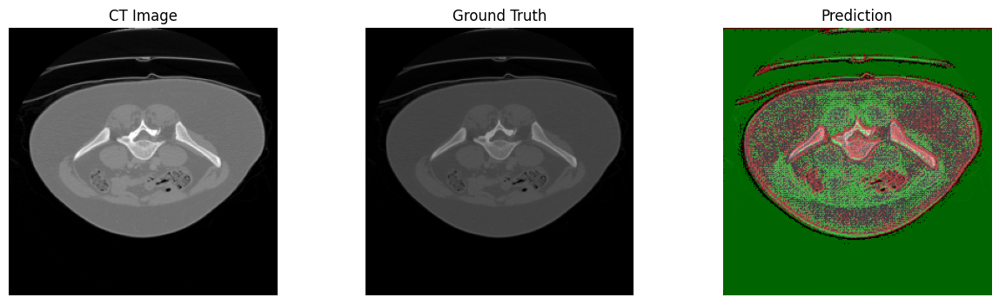

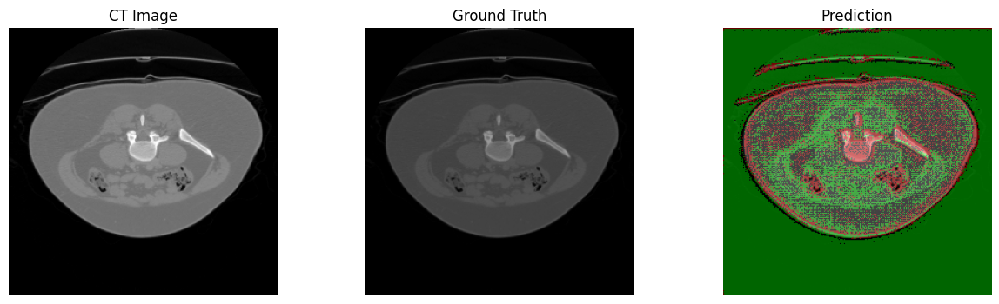

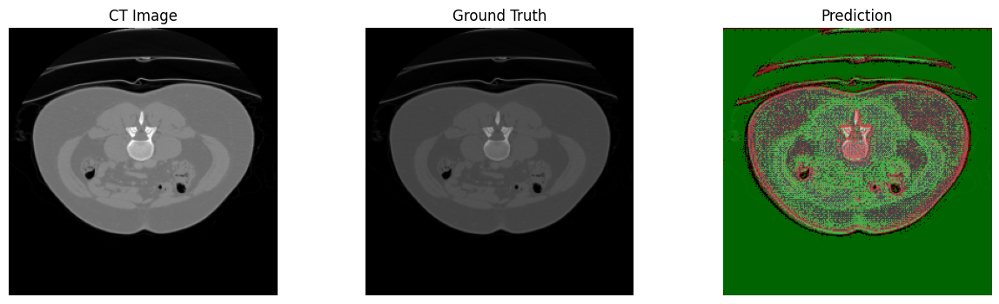

In [13]:
# Visualize predictions AFTER test loop
visualize_prediction(model, test_dataset, index=0)
visualize_prediction(model, test_dataset, index=5)
visualize_prediction(model, test_dataset, index=25)
